# 一维非稳态扩散方程
控制方程：
$$
\frac{\partial u}{\partial t} = \mu \frac{\partial ^2 u}{\partial x^2}
$$
初始条件：$u(x, t=0)=U_0(x)$，边界条件$u(x=0, t) = u(x+l, t)=0$

In [16]:
import numpy as np
import matplotlib.pyplot as plt

import matplotlib.animation as animation
plt.rcParams['animation.html'] = 'jshtml'

In [2]:
# 定义计算域
L = 1.0 # 计算域长度，m
n = 101 # 网格数
x = np.linspace(0, L, n)
dx = x[1] - x[0]

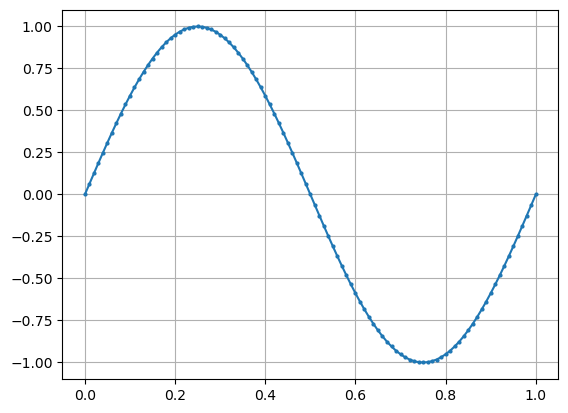

In [10]:
# 定义初始条件
U0 = np.sin(2.0 * np.pi * x)
plt.plot(x, U0, marker='o', markersize=2)
plt.grid()

In [11]:
# 定义公式中的参数
dt = 1e-3 # s
tend = 10.0 # s
μ = 1e-2 # m2/s

sol = []
sol.append(U0)

t = 0.0

while t < tend:
    
    un = sol[-1]

    unp1 = np.zeros_like(un)
    unp1[1:-1] = un[1:-1] + μ*dt/dx/dx * (un[2:] - 2*un[1:-1] + un[:-2]) # 内部点
    unp1[0] = unp1[-1] = 0

    sol.append(unp1)
    
    t += dt

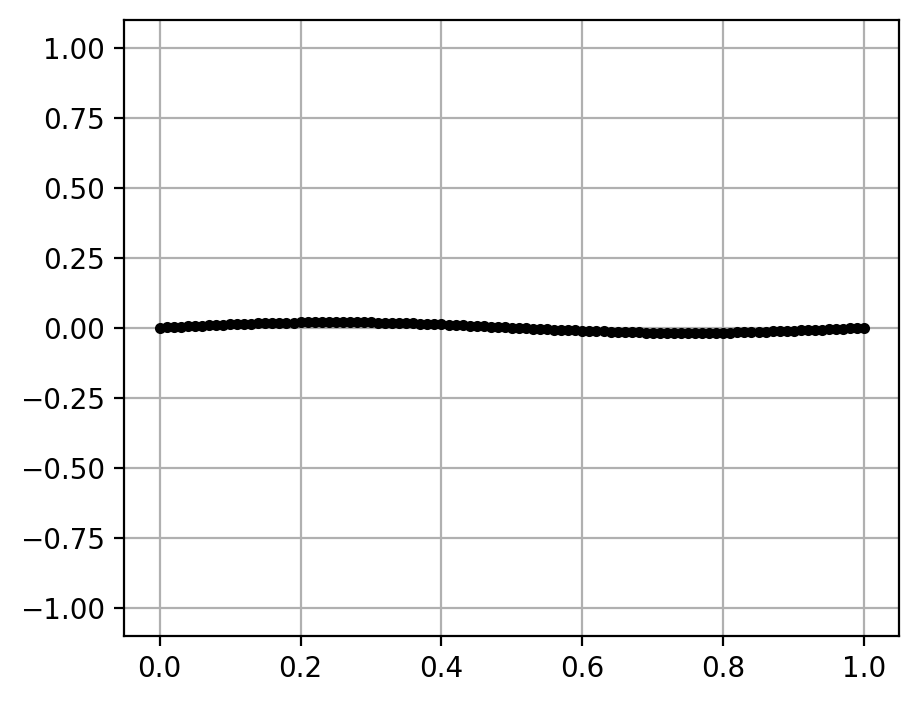

In [19]:
ims = []
fig = plt.figure(figsize=[5, 4], dpi=200)
plt.grid()

i = 0
for solution in sol:
    if (i%50==0):
        im = plt.plot(x, solution, color='k', marker='o', markersize=3, animated=True)
        plt.ylim(-1.1, 1.1)
        ims.append(im)
    i += 1
ani = animation.ArtistAnimation(fig, ims, interval=35, blit=True, repeat_delay=1000)
ani